# Global cell type marker genes
### An organotypic atlas of human vascular cells

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import seaborn as sns
import harmonypy as hm

%matplotlib inline

In [2]:
sc.settings.set_figure_params(dpi=150,fontsize=15)

In [3]:
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.8.2
sinfo       0.3.1
-----
PIL                         9.2.0
anndata                     0.8.0
asciitree                   NA
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.5
cffi                        1.15.1
cloudpickle                 2.0.0
colorama                    0.4.5
comm                        0.2.1
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.7.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
executing                   0.8.3
fasteners                   0.18
fsspec                      2022.7.1
h5py                        3.7.0
harmonypy                   NA
hypergeom_ufunc             NA
igraph                      0.9

In [4]:
adata_orig = sc.read_h5ad('/rds/general/user/snb20/projects/cardiac_single_cell_biology/live/Endothelial_datasets/paper_revision/adata_all_cells_brain_log1p_scvi_240213.h5ad')

In [5]:
adata = adata_orig

In [6]:
adata

AnnData object with n_obs × n_vars = 801715 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_p

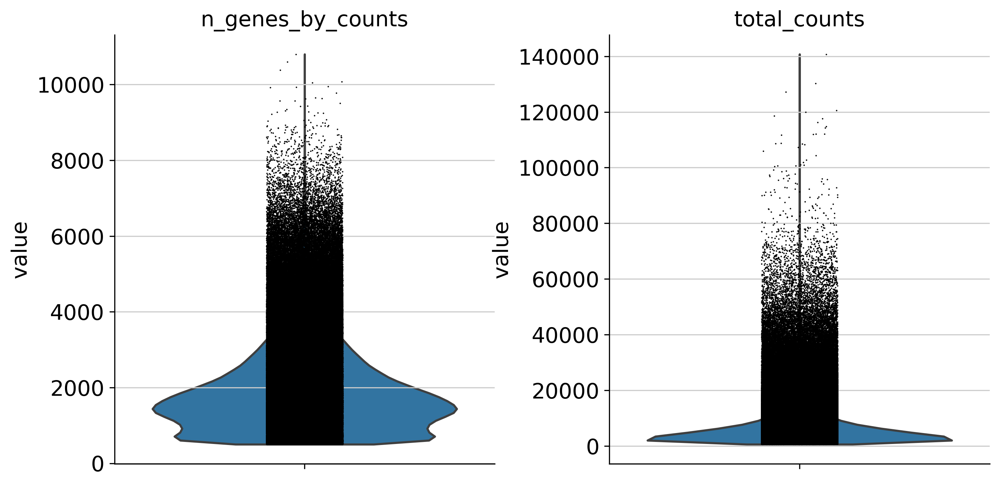

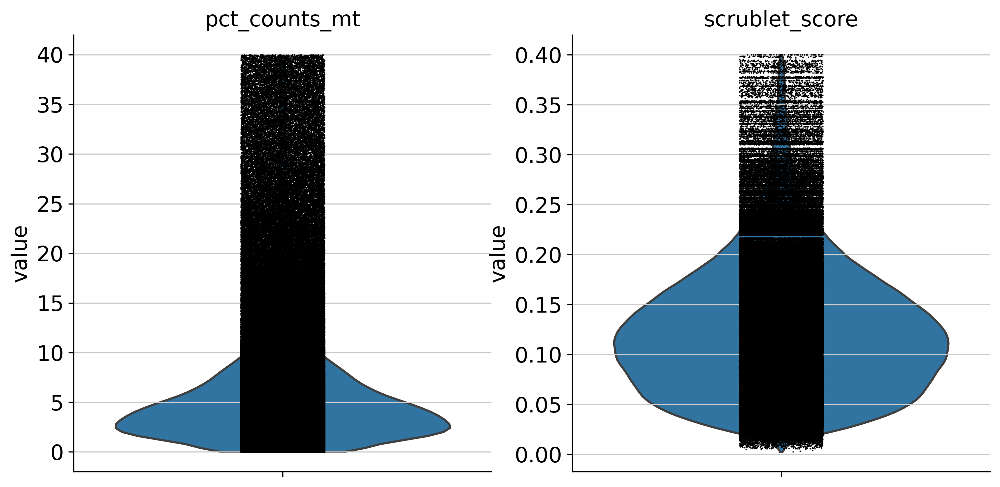

In [7]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], jitter=0.1, multi_panel=True)
sc.pl.violin(adata, ['pct_counts_mt',"scrublet_score"], jitter=0.1, multi_panel=True)

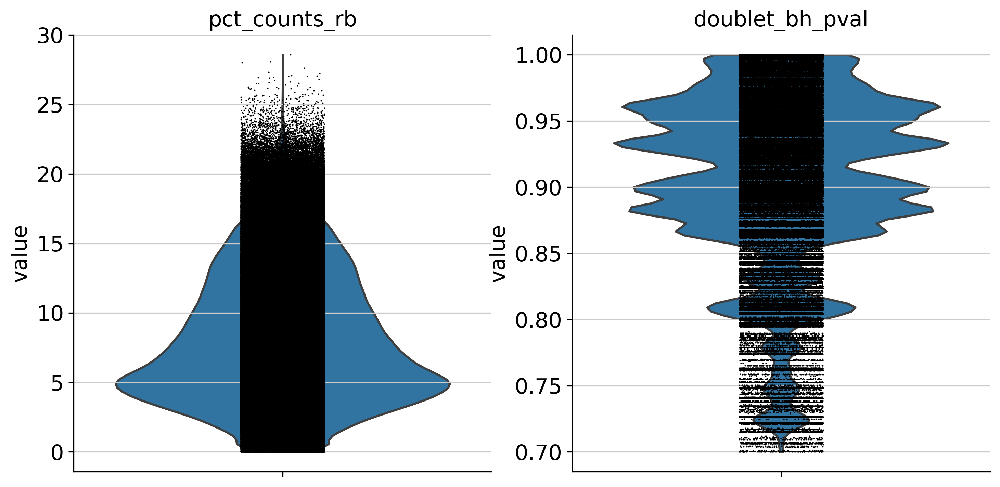

In [8]:
sc.pl.violin(adata, ['pct_counts_rb',"doublet_bh_pval"], jitter=0.1, multi_panel=True)

In [ ]:
df = pd.crosstab(adata.obs["organ_uni"], adata.obs["donor"])

import matplotlib.pyplot as plt

# Set the figure size before creating the plot
fig, ax = plt.subplots(figsize=(10, 10))  # Creating the figure and axis

# Assuming 'tmp' is your DataFrame containing the data for the bar plot
# Define a color palette with 22 colors
color_palette = plt.get_cmap('tab20').colors[:22]

# Plot the bar plot with stacked bars and custom colors
df.plot.bar(ax=ax, stacked=True, width=1, color=color_palette)

# Set tick label font size
ax.tick_params(axis='both', labelsize=14)

# Set x-axis label with larger font size
ax.set_xlabel('leiden', fontsize=18)

# Set y-axis label with larger font size
ax.set_ylabel('Cell_count', fontsize=18)

# Move the legend outside the plot
ax.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=20)

# Show the plot
plt.show()

In [ ]:
df = pd.crosstab(adata.obs["organ_uni"], adata.obs["leiden_anno"])

import matplotlib.pyplot as plt

# Set the figure size before creating the plot
fig, ax = plt.subplots(figsize=(10, 6))  # Creating the figure and axis

# Assuming 'tmp' is your DataFrame containing the data for the bar plot
# Define a color palette with 22 colors
color_palette = plt.get_cmap('tab20').colors[:22]

# Plot the bar plot with stacked bars and custom colors
df.plot.bar(ax=ax, stacked=True, width=1, color=color_palette)

# Set tick label font size
ax.tick_params(axis='both', labelsize=14)

# Set x-axis label with larger font size
ax.set_xlabel('leiden', fontsize=18)

# Set y-axis label with larger font size
ax.set_ylabel('Cell_count', fontsize=18)

# Move the legend outside the plot
ax.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=20)

# Show the plot
plt.show()

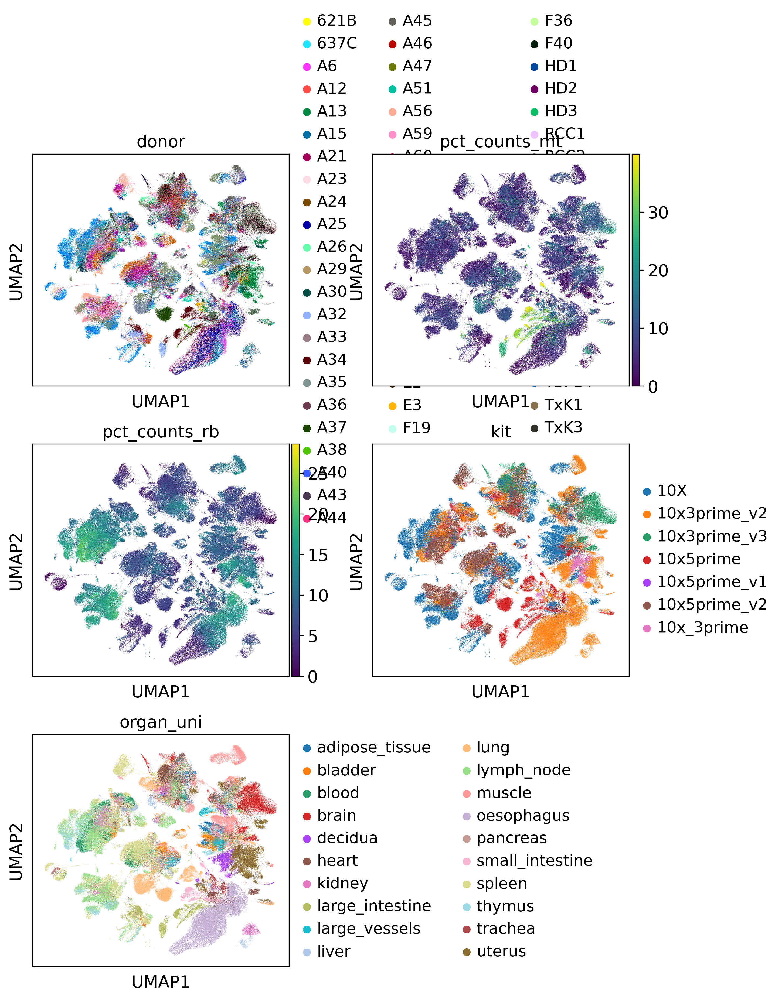

(None,)

In [10]:
sc.pl.umap(adata, color = ["donor","pct_counts_mt","pct_counts_rb","kit","organ_uni"], ncols = 2),

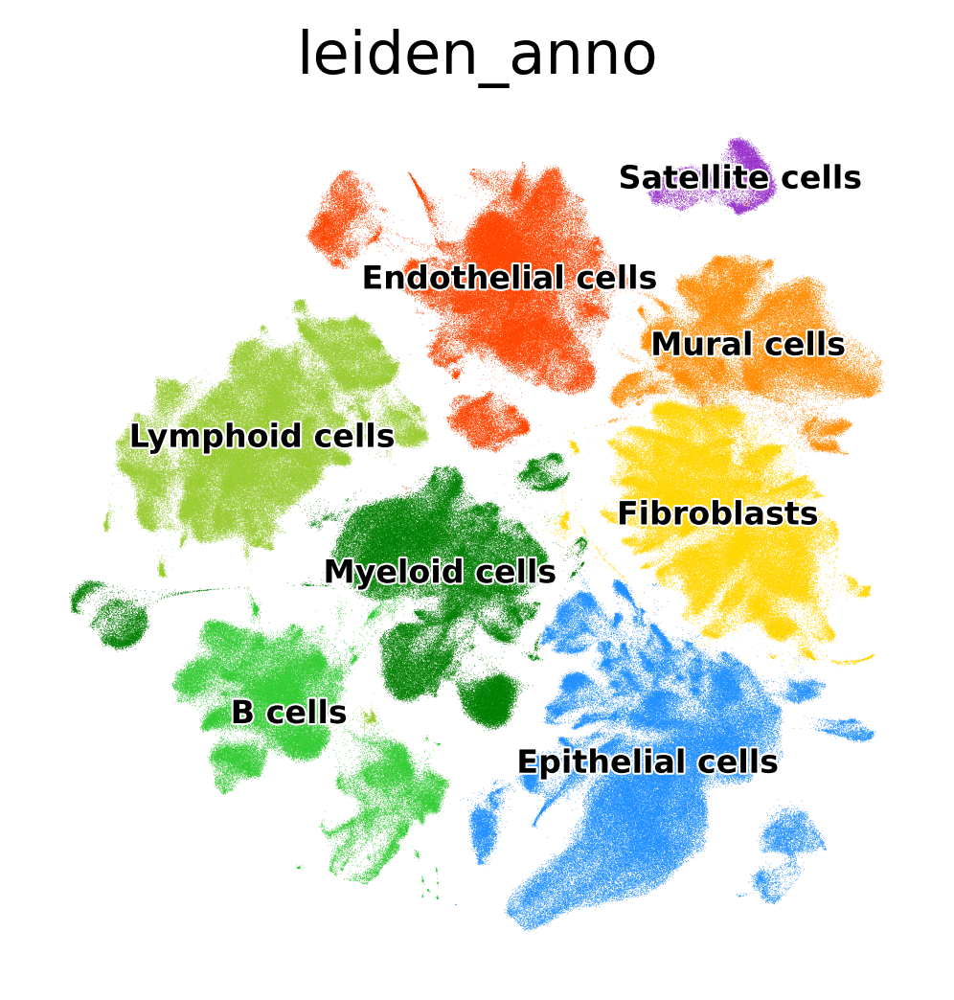

In [11]:
sc.pl.umap(adata, color = ['leiden_anno'], ncols=1, legend_loc = 'on data', legend_fontsize = 8, legend_fontoutline = 1, frameon = False,
           palette= ['orangered', # endothelial
                     'darkorange', # mural
                     'gold', # fibroblasts
                     'darkorchid', # satellite
                     'dodgerblue', # epithelial
                     'green', # myeloid
                     'limegreen', # B
                     'yellowgreen'] # lymphoid
)

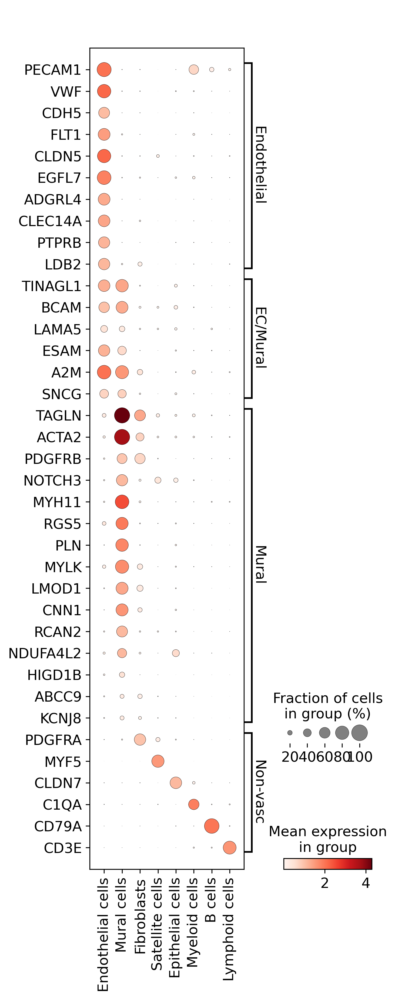

In [12]:
markers = {
    'Endothelial': ["PECAM1","VWF","CDH5","FLT1","CLDN5","EGFL7","ADGRL4","CLEC14A","PTPRB","LDB2"],
    'EC/Mural': ["TINAGL1","BCAM","LAMA5","ESAM","A2M","SNCG"],
    'Mural': ["TAGLN","ACTA2","PDGFRB","NOTCH3","MYH11","RGS5","PLN","MYLK","LMOD1","CNN1","RCAN2","NDUFA4L2","HIGD1B","ABCC9","KCNJ8",],
    'Non-vasc': ["PDGFRA","MYF5","CLDN7","C1QA","CD79A","CD3E"]
    }

sc.pl.dotplot(adata, markers, "leiden_anno", swap_axes = True)